# Self-Driving Car Engineer Nanodegree


## Project 2: **Advanced Lane Lines** 
***
The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---

## Import Packages

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import pickle

## Camera Calibration
---

#### Find Corners
Use the set of images located in the 'camera_cal\' folder of the project to determine corner locations for camera calibrations

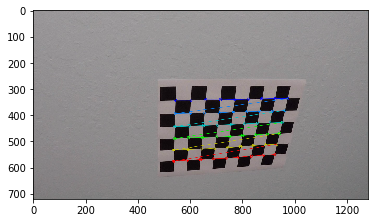

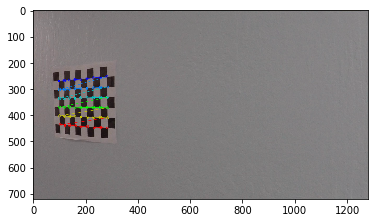

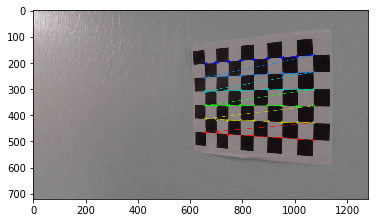

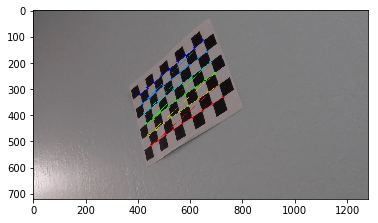

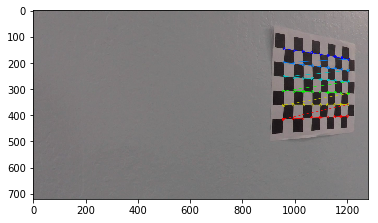

...

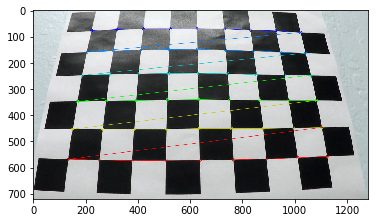

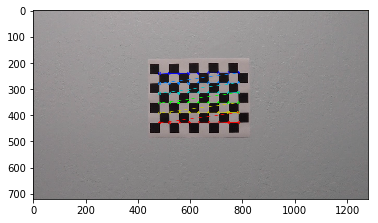

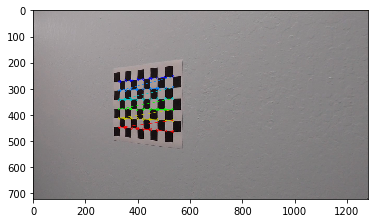

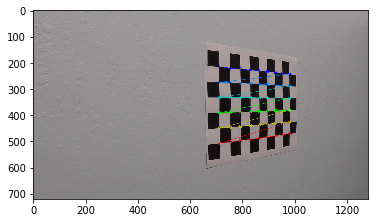

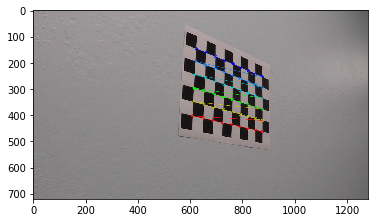

In [2]:
#list of images in camera_cal folder
images = glob.glob('./camera_cal/*.jpg')

#3-d coordinate reference space to use for object points of the corners found
objp = np.mgrid[0:9,0:6,0:1].T.reshape(-1,3).astype(np.float32)

#Arrays to store object points and source points
objpoints = []
imgpoints = []

#list used to keep track of images with found corners
corner_images = []

for fname in images:
    img = cv2.imread(fname)
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9, 6), None) #use 9x6 grid for images

    # If found, draw corners
    if ret == True:
        #append points to lists
        objpoints.append(objp)
        imgpoints.append(corners)
        
        #keep list of images found with valid corners for reference
        corner_images.append(fname)
        
        # Draw and display the corners
        cv2.drawChessboardCorners(img, (9, 6), corners, ret)
        plt.figure()
        plt.imshow(img)

#### Calculate calibration matrix and distortion coefficients

Use OpenCV functions cv2.calibrateCamera to calculate matrix and distortion coefficient data to undistort images taken by the camera. (Example of distortion corrected calibration image provided).

undistort test for calibration1.jpg


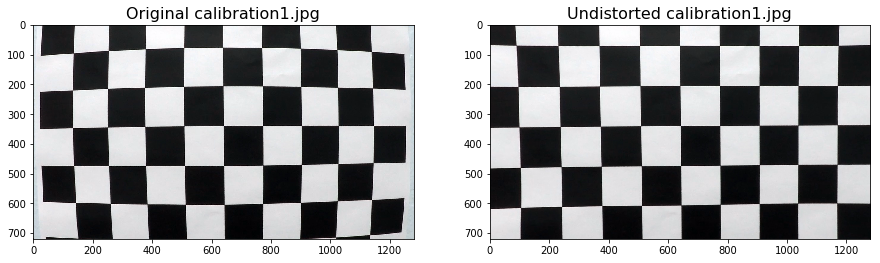

In [3]:
#test image undistort with calibration1.jpg
img = cv2.imread("./camera_cal/calibration1.jpg")

ret, mtx, dist, rvec, tvec = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1::-1], None, None)
undist = cv2.undistort(img, mtx, dist, None, mtx)

#save mtx and dist for later use
pickle.dump({'mtx': mtx, 'dist': dist}, open('./cam_cal_data.p', 'wb'))

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,9))
ax1.imshow(img)
ax1.set_title('Original calibration1.jpg', fontsize=16)
ax2.imshow(undist)
ax2.set_title('Undistorted calibration1.jpg', fontsize=16)

mpimg.imsave("./output_images/undistorted_calibration_1.jpg", undist)

print("undistort test for calibration1.jpg")

#### Example Distortion Corrected Images

Images taken from 'test_images/' to show example of the undistort effect of the previously calculated calibration data.

test images undistorted


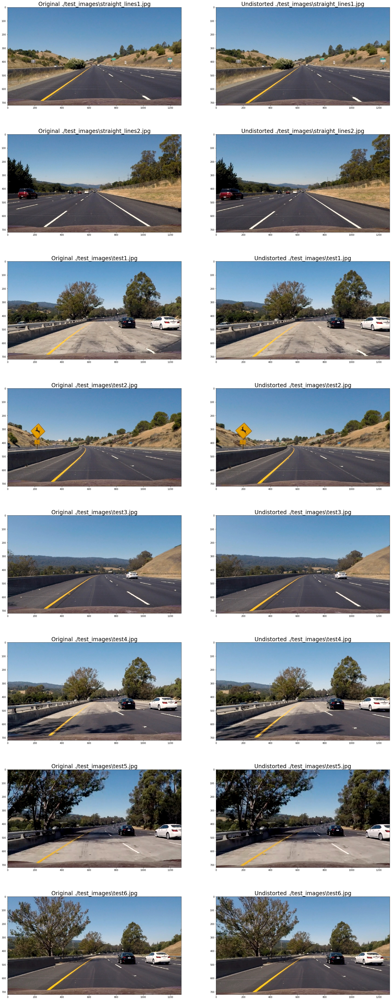

In [4]:
#test image undistort with files from test_image folder
test_images = glob.glob('./test_images/*.jpg')
num = len(test_images)
fig, axes = plt.subplots(num, 2, figsize=(30,10*num))

for i, fname in enumerate(test_images):
    img = mpimg.imread(fname)

    ret, mtx, dist, rvec, tvec = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1::-1], None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)

    axes[i][0].imshow(img)
    axes[i][0].set_title('Original ' + fname, fontsize=24)
    axes[i][1].imshow(undist)
    axes[i][1].set_title('Undistorted ' + fname, fontsize=24)
    
    mpimg.imsave("./output_images/undistorted_" + fname.split('/')[1].split('\\')[1], undist)

print("test images undistorted")